#**Facial Feature Detection using YOLO v8**
This exciting project focuses on the precise detection of various facial features, including the face itself, eyes, eyebrows, nose, and mouth. The dataset for this project comprises meticulously annotated images, ensuring that each of the aforementioned features is thoroughly labeled.

I am committed to developing a state-of-the-art solution to provide accurate and robust feature detection in close-up images. I understand that the ability to reliably identify and analyze these facial features can have a wide range of applications, from improving facial recognition technology to assisting in medical diagnostics. This project stands at the intersection of computer vision and artificial intelligence, harnessing the power of YOLO v8 (You Only Look Once version 8) for efficient and effective feature detection.

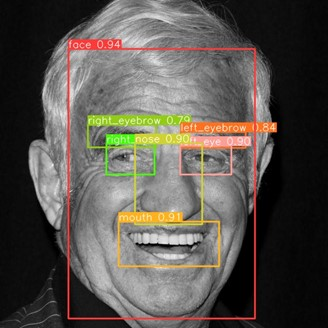

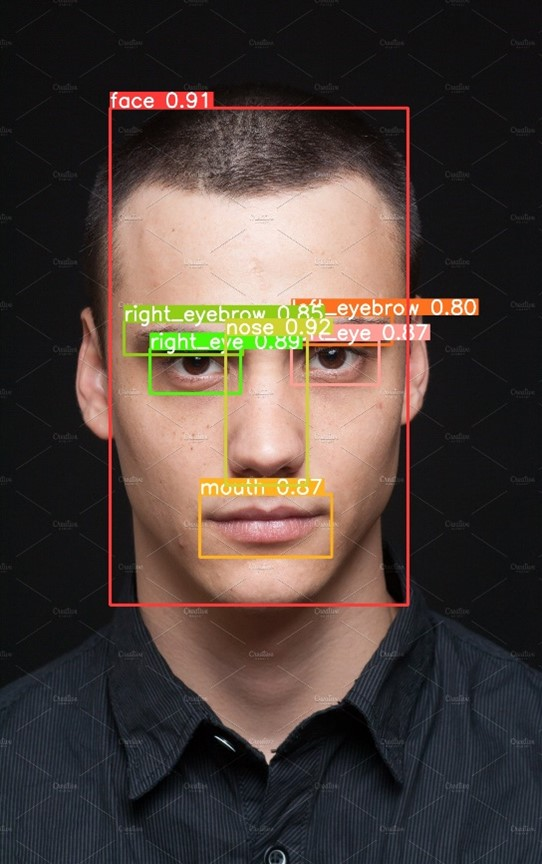

##**Annotations**

I utilized a powerful tool called Roboflow to streamline my image annotation process. Roboflow not only provided a user-friendly interface for annotating images but also featured a remarkable label assist tool that automated the annotation process. This invaluable automation not only saved me time but also improved the accuracy and consistency of the annotations. With Roboflow's assistance, I was able to efficiently label and annotate my images, making the entire data preparation phase of my project much more efficient and precise.

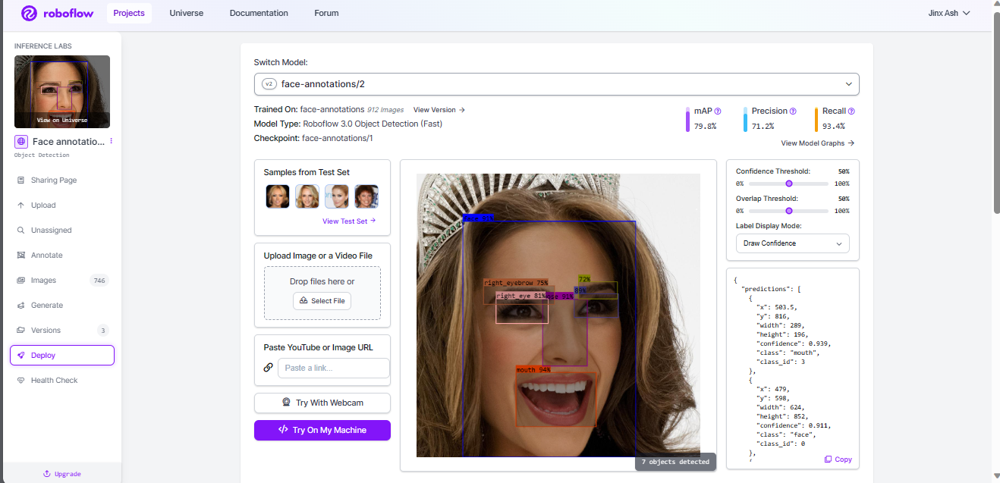

###**Importing the necessary libraries**


In [1]:
import os
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.collections import PatchCollection
from matplotlib.colors import ListedColormap
from PIL import Image
import torch
import cv2
from pathlib import Path
from torch.utils.data import Dataset, DataLoader,random_split
from torchvision import transforms
# import torch_xla
# import torch_xla.core.xla_model as xm

from PIL import Image
import pandas as pd
import numpy as np
import csv
torch.cuda.empty_cache()

!export PYTORCH_CUDA_ALLOC_CONF=max_split_size_mb:100

##**Mounting the files from Google drive**

In [2]:
from google.colab import drive

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


 ### **Installing the ultralytics library**


In [4]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 5.8 MB/s eta 0:00:00


###**Initialising the Yolo Model and training the Face Dataset.**
In this code snippet, we utilize the YOLO (You Only Look Once) object detection model, specifically the YOLOv8 architecture, initialized with a pre-trained checkpoint ('yolov8s.pt'). The goal is to train the model on a custom dataset, and this is accomplished by providing a YAML configuration file ('data.yaml') that specifies key dataset details, including image and annotation file paths, class names, and training parameters. The training process is set to run for 100 epochs, where each epoch represents one complete pass through the dataset. During training, input images are resized to 640x640 pixels. The results of the training, including loss values and other relevant metrics, are stored in the 'results' variable, enabling the monitoring and evaluation of the model's performance throughout the training procedure


In [5]:
from ultralytics import YOLO
model = YOLO('yolov8s.pt')

results = model.train(data='/content/drive/MyDrive/dataset/data.yaml', epochs=100, imgsz=640)

##**Validation results**
In the evaluation of the Ultralytics YOLOv8.0.207 model, we observe a model summary indicating it has 168 layers with 11,128,293 parameters, and it operates at 28.5 GFLOPs. The model was trained using Python 3.10.12 and Torch 2.1.0 with CUDA on a Tesla T4 GPU. During evaluation, it achieved impressive results on the validation dataset, which contained 149 images. The model demonstrated excellent performance across various classes. Notably, the 'all' class achieved a mean Average Precision (mAP) of 0.864, indicating high precision and recall. The 'face' class exhibited a remarkable mAP of 0.884, and other classes, including 'left_eye,' 'left_eyebrow,' 'mouth,' 'nose,' 'right_eye,' and 'right_eyebrow,' also showed strong mAP scores. The model's speed is commendable, with preprocessing taking 0.8ms, inference 10.1ms, and post-processing 3.7ms per image. The results are saved in the 'runs/detect/val' directory, with mAP values for each class provided in an array.

In [12]:
model = YOLO('/content/drive/MyDrive/another_destination/detect/train/weights/best.pt')
metrics = model.val()
metrics.box.map
metrics.box.map50
metrics.box.maps

Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11128293 parameters, 0 gradients, 28.5 GFLOPs
100%|██████████| 755k/755k [00:00<00:00, 22.3MB/s]
val: Scanning /content/drive/MyDrive/dataset/valid/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:17<00:00,  1.70s/it]
                   all        149       1040      0.823      0.848      0.864       0.68
                  face        149        149       0.99          1      0.995      0.884
              left_eye        149        148      0.734      0.728      0.788      0.579
          left_eyebrow        149        147       0.73      0.694      0.749      0.518
                 mouth        149        150       0.97      0.973      0.991      0.834
                  nose        149        149      

array([    0.88407,     0.57897,     0.51776,     0.83369,     0.86101,     0.59675,      0.4885])

##**Predictions made on the Validation Dataset and a Random Image**

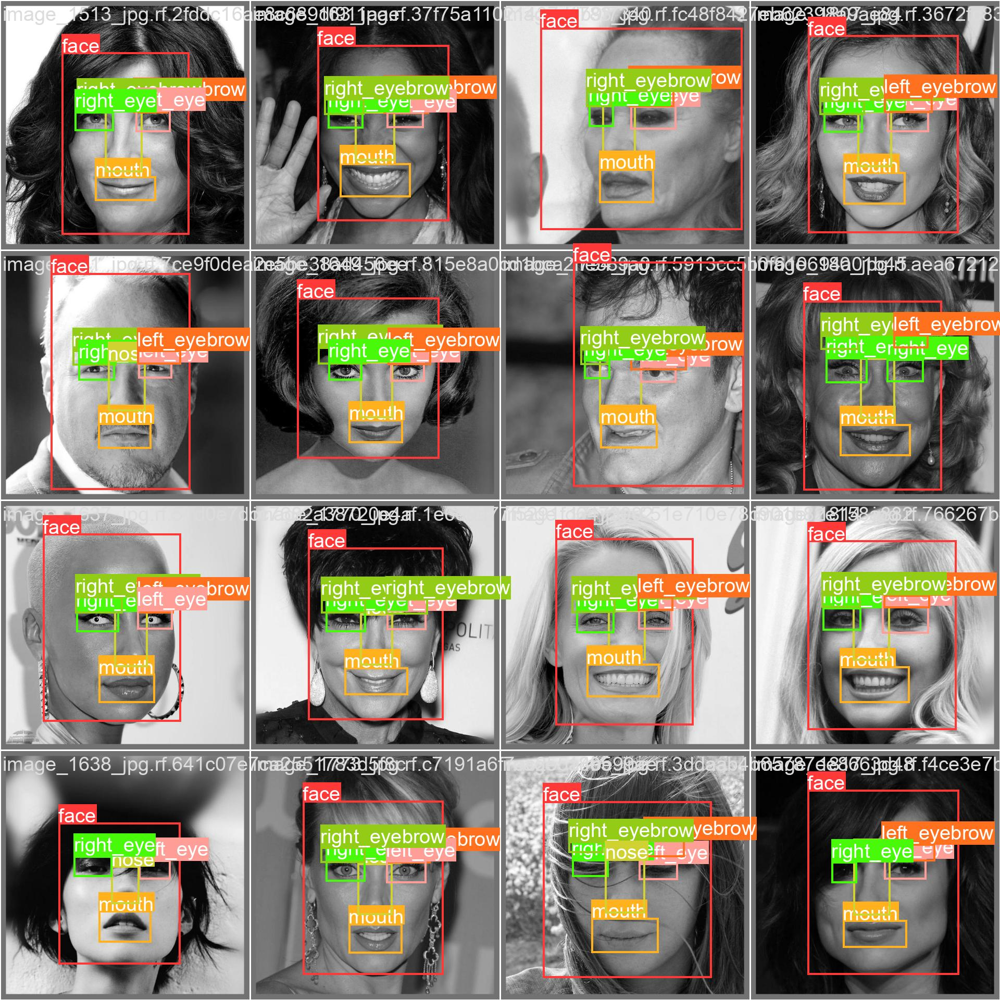

In [13]:
Image.open("/content/runs/detect/val/val_batch2_labels.jpg")


image 1/1 /content/drive/MyDrive/test Images/image 1.jpg: 640x416 1 face, 1 left_eye, 1 left_eyebrow, 1 mouth, 1 nose, 1 right_eye, 1 right_eyebrow, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 416)
Results saved to runs/detect/predict


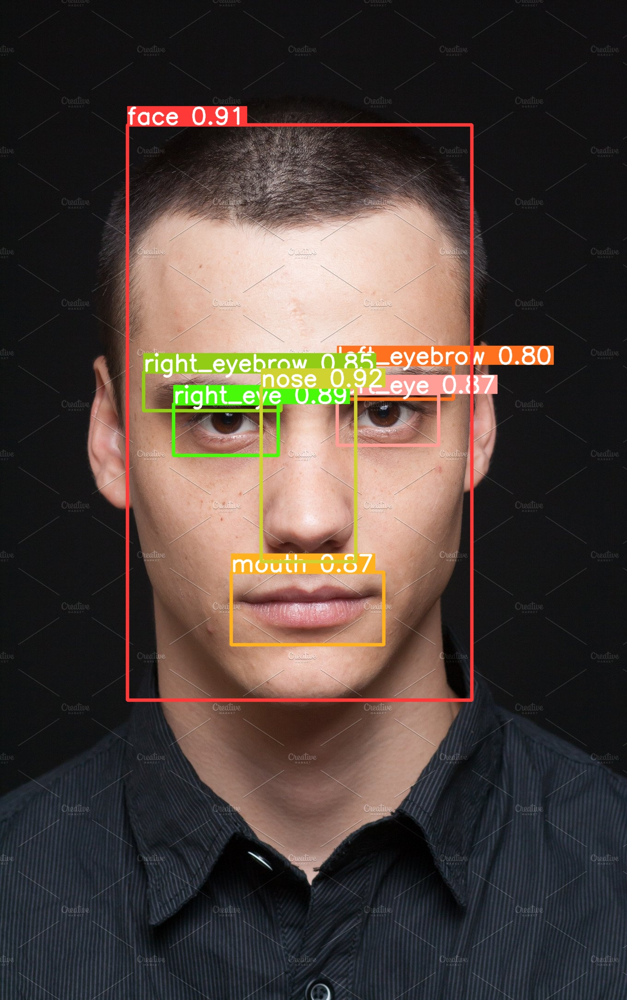

In [11]:
model.predict("/content/drive/MyDrive/test Images/image 1.jpg",save=True ,conf=0.5)
Image.open("/content/runs/detect/predict/image 1.jpg")

##**Confusion Matrix**

**Positive Aspects:**

High Accuracy for Face and Background Classes: The model's exceptional accuracy in predicting the "face" and "background" classes is a significant highlight. These classes are fundamental in various applications, and the model's ability to precisely and consistently detect them is commendable. The high precision and recall values for these classes underscore the model's proficiency in identifying these crucial features in images. This reliability can be particularly valuable in scenarios where accurate detection of faces and backgrounds is essential, such as security and surveillance applications.

**Challenges:**

Struggles with Specific Classes: While the model excels in detecting general classes like "face" and "background," it faces challenges in accurately predicting more specific classes, including "left eye," "right eye," "eyebrows," "mouth," and "nose." The precision and recall scores for these specific classes are notably lower, indicating a need for improvement in distinguishing these finer features. Enhancing the model's ability to identify these intricate details could lead to more comprehensive and precise object detection, benefiting applications like facial recognition and expression analysis. Addressing these challenges through targeted model fine-tuning and data augmentation may be necessary to elevate the model's performance on these specific classes.

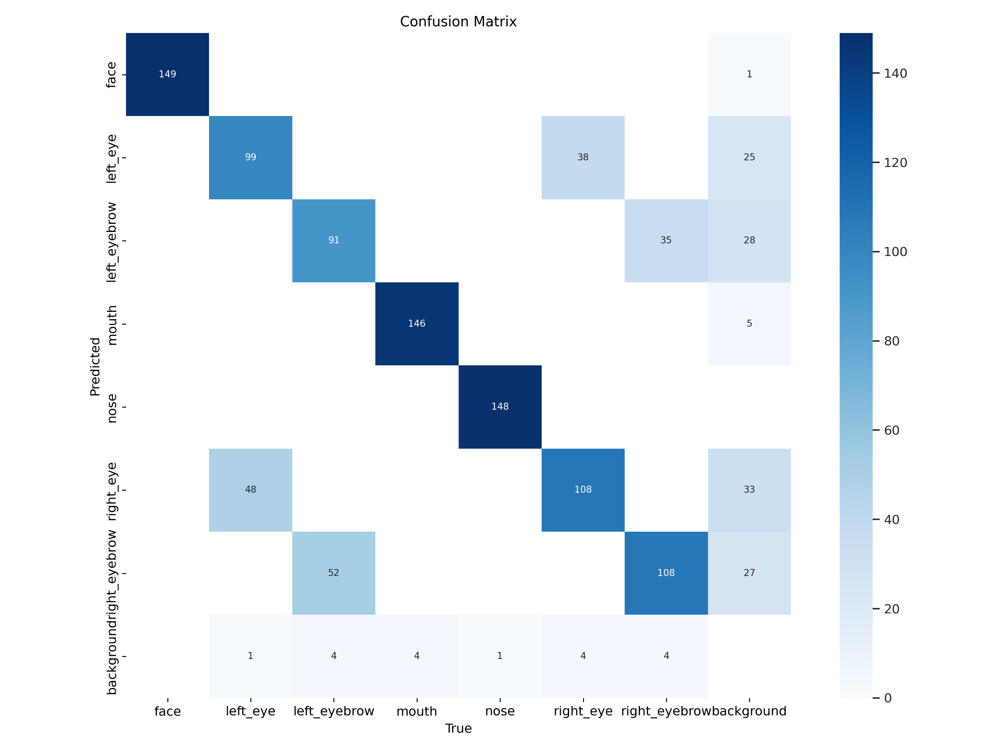

In [ ]:
from PIL import Image
Image.open("/content/runs/detect/val/confusion_matrix.png")